# Branching Out into Isolation Forests

### Tree Based Anomaly Detection

Stephanie Kirmer   
ChiPy October 2020

In [1]:
import numpy as np
import pandas as pd
import logging as log
import os
import datetime
import typing
from typing import Callable, List
import re
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import minmax_scale
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import shap

from bokeh.plotting import figure, output_notebook, show, output_file
from bokeh.models import ColorBar, ColumnDataSource
from bokeh.palettes import Spectral6, brewer
from bokeh.transform import linear_cmap, factor_cmap

from plotnine import *
import plotnine.options as pn

import matplotlib.pyplot as plt
import graphviz
import plotly.express as px
import plotly.graph_objects as go

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

rng = np.random.RandomState(42)

# Introduction

Isolation forests are a method using tree-based decisionmaking to separate observations instead of grouping them. You might visualize this in tree form:

<img src="../IsolationForest1.png" alt="diagram1" width="600"/>



If you prefer to think about the points in two dimensional space, you can also use something like this:

<img src="../2d_diagram_b.png" alt="diagram1" width="600"/>

Here you can see that a highly anomalous observation is easily separated from the bulk of the sample, while a non-anomalous one requires many more steps to isolate.

Today we are going to implement this modeling approach using a sample of data from Spotify- song characteristics.
We'll be using these libraries:
* **data stuff**: pandas, numpy
* **modeling**: sklearn, shap
* **visuals**: bokeh, plotnine, plotly, matplotlib, graphviz

# Load data 

From Kaggle - tracks on Spotify

https://www.kaggle.com/yamaerenay/spotify-dataset-19212020-160k-tracks?select=data.csv

Let's identify really unusual tracks!

In [2]:
dataset = pd.read_csv("/Users/skirmer/projects/isolationforests/data/data.csv")

Characteristics of the tracks:

In [3]:
dataset.columns

Index(['acousticness', 'artists', 'danceability', 'duration_ms', 'energy',
       'explicit', 'id', 'instrumentalness', 'key', 'liveness', 'loudness',
       'mode', 'name', 'popularity', 'release_date', 'speechiness', 'tempo',
       'valence', 'year'],
      dtype='object')

Time to look at examples! Let's see some highly instrumental tracks.

In [4]:
dataset.query("instrumentalness > .94")[['artists', 'name', 'year']].sample(frac=0.001, replace=False, random_state=3)

,artists,name,year
127348,['M. K. Thyagaraja Bhagavathar'],Eesan Kaanmino,1939
138009,"['Johann Sebastian Bach', 'Glenn Gould']","Partita No. 3 in A Minor, BWV 827: II. Allemande",1957
101081,['Miles Davis'],"Évasion de Julien - BOF ""Ascenseur pour l'écha...",1958


What about very "speechy" ones?

In [5]:
dataset.query("speechiness > .90")[['artists', 'name', 'year']].sample(frac=0.001, replace=False, random_state=42)

,artists,name,year
89377,"['Ernst H. Gombrich', 'Christoph Waltz']",Eine kurze Weltgeschichte für junge Leser: Von...,1936
36198,['Rodney Dangerfield'],No Respect,1980
17345,['Kurt Heynicke'],Kapitel 21 - Oktoberfrühling,1952


Finally let's poke at the loud ones.

In [6]:
dataset.query("loudness > .85")[['artists', 'name', 'year']].sample(frac=0.2, replace=False, random_state=999)

,artists,name,year
93131,['The Stooges'],Search and Destroy - Iggy Pop Mix,1973
54020,"['Sergio Vega ""El Shaka""']","Musico, Poeta y Loco",2004


Yeah, that tracks! Sounds all right, that tells us something about these songs.

# Feature Engineering

This is going to be very minimal, because we want to get right to the model. One thing I'm doing is binning the years, and cutting off songs before 1960, just because the data is a little different before that time. We want to find songs that are truly unusual, not just weird data collection.

In [7]:
dataset = dataset.query('year > 1960')
dataset['year_bin'] = pd.cut(dataset['year'],9)

In [8]:
pn.figure_size = (7,3)
# Must downsample to get any reasonable rendering speed
plotset = dataset.sample(frac=0.2, replace=False, random_state=1)
plotset.shape

(23931, 20)

This leaves us with this feature set, for all songs listed after 1960. Also, I'm downsampling for the graphs (only those, not for the modeling) to allow us to visualize things more easily.

In [9]:
features = ['acousticness', 'explicit', 'duration_ms','instrumentalness', 'key',
            'liveness', 'loudness', 'mode', 'popularity','valence',
            'speechiness', 'tempo', 'energy', 'danceability']

# Model Training

I like to put my model training steps in a function- it keeps things tidy.

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.IsolationForest.html

In [10]:
def fit_model(dataframe, feature_list):
    ''' Accepts dataframe and list of features to be used in model training. 
    Returns trained model object and dataset with NAs removed and anomalousness 
    features appended. '''
    
    # Handle missingness
    nd = dataframe.dropna()
    #nd = dataframe.fillna(value=0)
    
    # Train the model
    X_train2 = nd.loc[:,feature_list]
    clf = IsolationForest(n_estimators=300, 
                          #max_features=5,
                          max_samples=300,
                          contamination=.02, 
                          bootstrap=True,
                          verbose=0,
                          random_state=rng)
    clf.fit(X_train2)
    decfn = clf.decision_function(X_train2)
    scores = clf.score_samples(X_train2) 

    # Predict, then append predictions and some other features.
    y_pred_train = clf.predict(X_train2)
    X_train2.loc[:,'preds'] = y_pred_train
    X_train2.loc[:,'preds_txt'] = X_train2.loc[:,'preds'].replace({-1:"Anomaly", 1: "Normal"})
    X_train2.loc[:,'decision_fn'] = decfn
    X_train2.loc[:,'scores'] = scores
    X_train2.loc[:,'year_bin'] = nd.loc[:,'year_bin']

    # Return model and the augmented data.
    return(clf, X_train2)

In [11]:
def predict_on_new(newdata, feature_list, modelobj):
    ''' Accepts dataframe, trained model object, and list of features required by model. 
    Returns dataset with NAs removed and anomalousness features appended. '''

    # Handle missingness
    nd = newdata.dropna()
    #newdata.fillna(value=0, inplace=True)
    
    # Predict
    dataframe = nd.loc[:, feature_list]
    decfn = modelobj.decision_function(dataframe)
    scores = modelobj.score_samples(dataframe)
    y_pred_test = modelobj.predict(dataframe)
    
    # Augment dataframe
    dataframe.loc[:,'preds'] = y_pred_test
    dataframe.loc[:,'preds_txt'] = dataframe.loc[:,'preds'].replace({-1:"Anomaly", 1: "Normal"})
    dataframe.loc[:,'decision_fn'] = decfn
    dataframe.loc[:,'scores'] = scores
    dataframe.loc[:,'year_bin'] = nd.loc[:,'year_bin']
    
    # Return augmented data
    return(dataframe)

In [12]:
X_train, X_test = train_test_split(dataset, test_size=0.3)

In [13]:
modobj, new_X_train= fit_model(X_train, features)

In [14]:
new_X_train[['preds','preds_txt','decision_fn','scores']].head()

,preds,preds_txt,decision_fn,scores
11531,1,Normal,0.081888,-0.499552
151682,1,Normal,0.067252,-0.514188
147888,1,Normal,0.118299,-0.463142
111807,1,Normal,0.126708,-0.454732
63004,1,Normal,0.115847,-0.465593


# Predict on Test Holdout

In [15]:
new_X_test = predict_on_new(newdata=X_test, feature_list=features, modelobj=modobj)
new_X_test[['preds','preds_txt','decision_fn','scores']].head()

,preds,preds_txt,decision_fn,scores
55067,1,Normal,0.138246,-0.443194
104078,1,Normal,0.117361,-0.464080
96192,1,Normal,0.114404,-0.467037
37647,1,Normal,0.132059,-0.449381
42492,1,Normal,0.148011,-0.433429


## Feature Importances

I'm going to use Shapley values here to evaluate which features are turning out to be most helpful in isolating our observations. Notice that the number of pertinent features is going to equal the number of features that we selected in the model training.

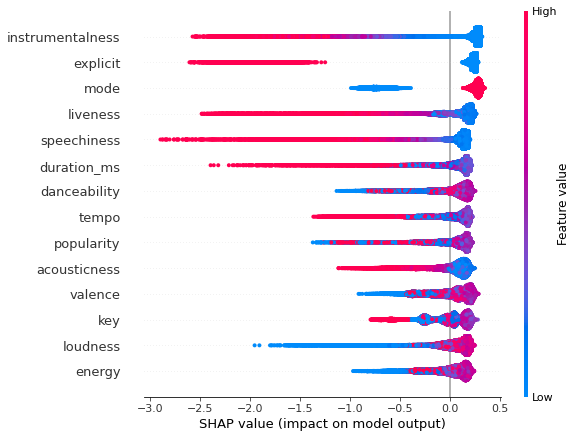

In [16]:
X_explain = new_X_test.drop(['preds', 'preds_txt', 'year_bin', 'scores', 'decision_fn'], axis=1)
shap_values = shap.TreeExplainer(modobj).shap_values(X_explain)
shap.summary_plot(shap_values, X_explain)

# Analyze Predictions


In [17]:
new_X_test['preds'].value_counts(normalize=True) * 100

 1    98.075048
-1     1.924952
Name: preds, dtype: float64

In [18]:
new_X_train['preds'].value_counts(normalize=True) * 100

 1    97.999021
-1     2.000979
Name: preds, dtype: float64

In [19]:
output_notebook() 
# create a new plot with a title and axis labels
p = figure(title="Training Sample Score", y_axis_label='speechiness Score', x_axis_label='Tempo, bpm', width=700, height = 300)

source = ColumnDataSource(data=dict(x=new_X_train['tempo'], 
                                y=new_X_train['speechiness'], 
                                ur = new_X_train['preds_txt'],
                                legend_group= new_X_train['preds_txt']))

colors = factor_cmap('ur', palette=Spectral6, factors=new_X_train.preds_txt.unique()) 
p.circle(color=colors, legend_group = 'legend_group', source=source, fill_alpha=.75, line_alpha = .5)
show(p)

Loading BokehJS ...

In [20]:
# create a new plot with a title and axis labels
p = figure(title="Test Sample Score", y_axis_label='liveness Score', x_axis_label='energy', width=700, height = 300)

source = ColumnDataSource(data=dict(x=new_X_test['energy'], 
                                y=new_X_test['liveness'], 
                                ur = new_X_test['preds_txt'],
                                legend_group= new_X_test['preds_txt']))

colors = factor_cmap('ur', palette=Spectral6, factors=new_X_test.preds_txt.unique()) 
p.circle(color=colors, legend_group = 'legend_group', source=source)
show(p)

## Plot Trees

We can look into the actual trees in our forest to see some of the decision choices that the model made.

This tree starts with the duration. Short songs to the left, long to the right. I'm using graphviz to produce this lovely diagram.

In [21]:
fig = plt.figure(figsize=(3,3))

fn=new_X_test.columns
cn=new_X_test.preds
fn2 = list(new_X_test.columns[modobj.estimators_features_[5]])

dot_data= tree.export_graphviz(modobj.estimators_[5], 
                     out_file=None, 
                      feature_names=fn2,  
                      class_names=cn,  
                      filled=True, 
                     rounded=True,
                     max_depth=3,
                      special_characters=True)  

graph = graphviz.Source(dot_data)  

<Figure size 216x216 with 0 Axes>

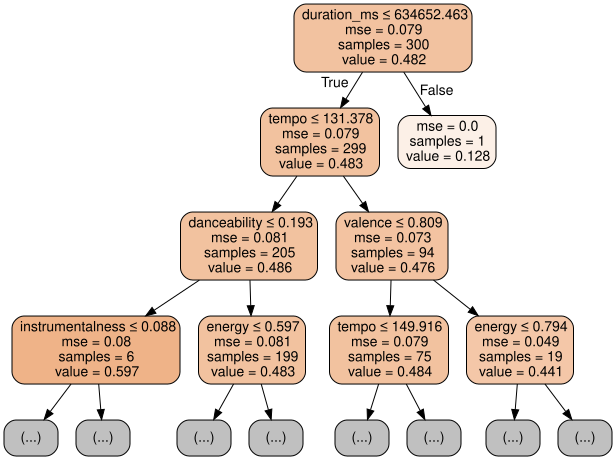

In [22]:
graph

# PCA

Another way to explore our results is to apply PCA to the features, and see where the items marked outlier by our model appear. If the model has done well, we should see our outliers on the margins and away from the center of the PCA plot.

I am randomly downsampling to allow us to visualize the data more easily.

In [23]:
downsampled = new_X_test.sample(frac=0.35, replace=False, random_state=1)
downsampled = downsampled.reset_index()
d_anoms = downsampled[downsampled['preds_txt'] == 'Anomaly']

In [24]:
outlier_index=list(d_anoms.index)
pca = PCA(n_components=3)  # Reduce to k=3 dimensions
scaler = StandardScaler()
#normalize the metrics
X = scaler.fit_transform(downsampled[features])
X_reduce = pca.fit_transform(X)

In [25]:
X_reduce2 = pd.DataFrame(X_reduce)
X_reduce2.head()

for i in outlier_index:
    X_reduce2.loc[i, 'outlier_index']= 'Anomaly'
    X_reduce2.loc[i, 'outlier_color']= '#ff0000'
    
values = {'outlier_index': 'Normal', 'outlier_color': '#0066ff'}
X_reduce2b = X_reduce2.fillna(value=values)

X_reduce2b.head()
X_reduce2b['outlier_index'].value_counts()

Normal     12343
Anomaly      221
Name: outlier_index, dtype: int64

In [26]:
x=X_reduce2b[2]
y=X_reduce2b[0]
z=X_reduce2b[1]
col=X_reduce2b['outlier_color']

In [27]:
fig = go.Figure(data=[go.Scatter3d(
    x=x,y=y,z=z,mode='markers',
    marker=dict(size=2, color = np.array(col),
                colorscale = 'Viridis', opacity=0.8))])
fig.update_layout(
    autosize=False,
    width=600,height=500,
    margin=dict(l=5,r=5,b=5,t=5,pad=1))
fig.show()

## Other Exploration

I want to check a few other things before calling the job done. Are our anomalies pretty evenly distributed across time periods?

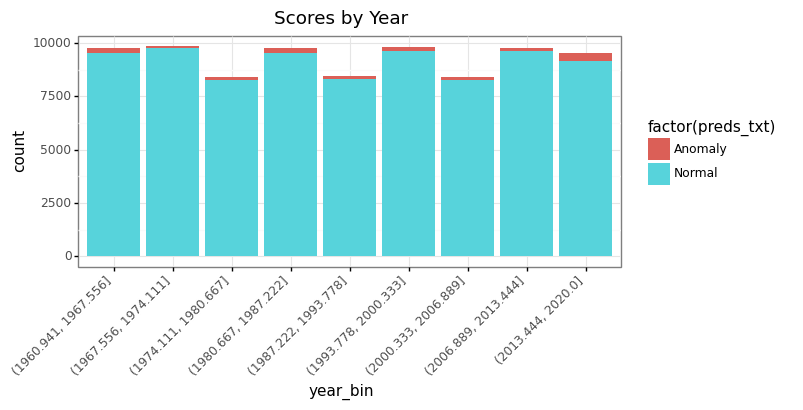

<ggplot: (320191229)>

In [28]:
(ggplot(new_X_train, aes(x='year_bin', fill='factor(preds_txt)'))
        + theme_bw()
        +theme(axis_text_x=element_text(rotation=45, hjust=1))
        + geom_bar()
        + labs(title = 'Scores by Year'))

In [29]:
pd.crosstab(new_X_test['preds_txt'], new_X_test['year_bin'])

year_bin,"(1960.941, 1967.556]","(1967.556, 1974.111]","(1974.111, 1980.667]","(1980.667, 1987.222]","(1987.222, 1993.778]","(1993.778, 2000.333]","(2000.333, 2006.889]","(2006.889, 2013.444]","(2013.444, 2020.0]"
preds_txt,,,,,,,,,
Anomaly,119,35,30,87,61,73,41,74,171
Normal,4101,4127,3579,4165,3480,4100,3573,4139,3942


What are the score values looking like, out of curiosity?

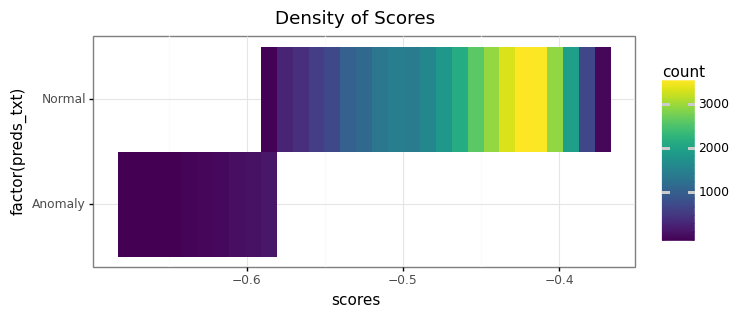

<ggplot: (320190654)>

In [30]:
(ggplot(new_X_test, aes(x='scores', y='factor(preds_txt)'))
        + theme_bw()
        + geom_bin2d()
        + labs(title = 'Density of Scores'))

## Spot Check

Now what I'd like to do is actually grab some titles and artists and just see what the model has decided is anomalous. Our data is pretty intuitive and the model is not too complex, so we ought to be able to infer what's up.

Remember that the Shapley values said that these were some of our most influential traits:
* liveness
* duration
* speechiness
* acousticness
* explicit

But we can look at all kinds of features from the trees. We'll start with a random sample.

In [31]:
anoms = new_X_test.query("preds_txt == 'Anomaly'")
tc = anoms.sample(frac=0.01, replace=False, random_state=1).index
dataset.loc[tc][['artists', 'name', 'year', 'speechiness', 'duration_ms',
                 'liveness', 'acousticness', 'instrumentalness', 'explicit',
                 'energy', 'tempo', 'valence']]

,artists,name,year,speechiness,duration_ms,liveness,acousticness,instrumentalness,explicit,energy,tempo,valence
59667,['Riley Lee'],Return Of The Fisherman,1984,0.0439,550360,0.0910,0.993,0.5760,0,0.0640,66.488,0.17400
138403,['Stan Kenton'],Say It Isn't So,1961,0.0340,156360,0.1580,0.971,0.9700,0,0.0392,77.986,0.03830
76902,['Liquid Mind'],Whisper to Me,2009,0.0503,484013,0.0881,0.962,0.9520,0,0.1100,59.117,0.03320
166675,['Public Enemy'],Countdown To Armageddon,1988,0.0623,100533,0.9720,0.977,0.0658,1,0.5090,105.207,0.18800
57517,['Bill Cosby'],The Pep Talk,1963,0.9200,105387,0.7370,0.911,0.0000,0,0.6390,105.376,0.71000
143947,['The Sleep Helpers'],Never Ending Rain,2017,0.0603,269328,0.9650,0.881,0.5790,0,0.9980,106.706,0.00001
72433,"['Richard Wagner', 'Wiener Philharmoniker', 'R...","Wagner: Lohengrin, WWV 75, Act 1: Prelude (Lan...",1964,0.0381,513600,0.1400,0.918,0.9550,0,0.0365,67.927,0.03150


In [32]:
# check to make sure indexing worked, look at score too
anoms.loc[tc][['key', 'duration_ms', 'instrumentalness', 'acousticness', 'explicit', 'scores', 'preds_txt']]

,key,duration_ms,instrumentalness,acousticness,explicit,scores,preds_txt
59667,11,550360,0.5760,0.993,0,-0.610187,Anomaly
138403,9,156360,0.9700,0.971,0,-0.581956,Anomaly
76902,5,484013,0.9520,0.962,0,-0.591611,Anomaly
166675,3,100533,0.0658,0.977,1,-0.631634,Anomaly
57517,10,105387,0.0000,0.911,0,-0.592554,Anomaly
143947,0,269328,0.5790,0.881,0,-0.623666,Anomaly
72433,9,513600,0.9550,0.918,0,-0.600607,Anomaly


Returning to the tree we looked at from our forest, let's think about what the tree paths are producing.


In [33]:
c1 = 'duration_ms <= 272654.606'
c2 = 'tempo <= 125.766'
c3 = 'danceability <= 0.204'
c4 = 'instrumentalness <= 0.1'

In [34]:
tc = anoms.index
full_anoms = dataset.loc[tc]
full_anoms.query(f"{c1} & {c2} & {c3} & {c4}")[['artists', 'name', 'year', 'duration_ms', 'instrumentalness', 'tempo', 'danceability']].head()

,artists,name,year,duration_ms,instrumentalness,tempo,danceability
125827,['Fabricantes De Lluvia'],Cozy Rain Sound,2017,169331,0.000000,52.764,0.0574
126004,['Crafting Audio'],Cabin Noise Focus,2018,162407,0.013800,80.628,0.1070
53453,['System Of A Down'],"Suite-Pee - Live at Irving Plaza, NYC, NY - Ja...",1998,178867,0.006000,67.934,0.1970
93970,['Bad Brains'],Sailin' On,1982,115040,0.000047,82.083,0.1390
14173,['Oasis'],Fuckin' In The Bushes,2000,199360,0.045100,100.609,0.1470


What about another branch? What do we find if we follow that road?

In [35]:
c1 = 'duration_ms > 272654.606'
c2 = 'speechiness > 0.196'
c3 = 'loudness > -3.478'
c4 = 'explicit > 0.606'

In [36]:
full_anoms.query(f"{c1} & {c2} & {c3} & {c4}")[['artists', 'name', 'year', 'explicit','duration_ms', 'speechiness', 'instrumentalness', 'valence', 'loudness']]


,artists,name,year,explicit,duration_ms,speechiness,instrumentalness,valence,loudness
24055,['Lil Darkie'],GENOCIDE,2019,1,632625,0.486,0.000000,0.604,0.457
36996,"['Eazy-E', 'MC Ren', 'Dr. Dre']",We Want Eazy - Remix,1988,1,398160,0.206,0.000000,0.632,-3.067
114852,['Tech N9ne'],Imma Tell,2002,1,285800,0.260,0.000000,0.565,-3.084
97597,"['Nio Garcia', 'Casper Magico', 'Bad Bunny', '...",Te Boté - Remix,2018,1,417920,0.214,0.000013,0.442,-3.445
125208,"['Eminem', 'Kobe Honeycutt']",Talkin’ 2 Myself,2010,1,300427,0.415,0.000000,0.494,-2.160
115695,['Eminem'],Cold Wind Blows,2010,1,303733,0.416,0.000000,0.584,-0.517
86853,"['JAY-Z', 'Alicia Keys']",Empire State Of Mind,2009,1,276920,0.392,0.000000,0.811,-1.538


# Conclusion

To recap, here's what we did:
* Explored dataset
* Trained an isolation forest model and predicted on a test sample
* Examined some of the trees in the model
* Plotted the data with PCA to confirm outliers being identified
* Spot checked records

I hope that you can use this in your own projects in the future! Thank you!


## Assorted Links

https://plotnine.readthedocs.io/en/stable/generated/plotnine.geoms.geom_violin.html#plotnine.geoms.geom_violin
https://plotnine.readthedocs.io/en/stable/api.html#geoms
https://scikit-learn.org/stable/modules/tree.html#tree
https://www.graphviz.org/download/
https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.IsolationForest.html
https://scikit-learn.org/stable/modules/generated/sklearn.tree.export_graphviz.html
https://plotly.com/python/line-and-scatter/
https://www.kaggle.com/yamaerenay/spotify-dataset-19212020-160k-tracks?select=data.csv
https://rise.readthedocs.io/en/stable/usage.html
https://towardsdatascience.com/anomaly-detection-with-isolation-forest-visualization-23cd75c281e2